# Monte Carlo Study of Bose-Einstein Condensation in an Isotropic 3D trap


[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/hariseldon99/StatMechCodes/blob/master/BEC_Trap.ipynb)

The goal of this simulation is to run a statistical model simulating the evolution of Bose-Einstein Condensation (BEC) of a gas of noninteracting bosons in $3-$dimensions. Since the emergence of BECttributed to the contribution of a great many particles in an even greater number of single particle states, a statistical method is to be utilised.

## Bose-Einstein Condensation
A Bose–Einstein condensate (BEC) is typically formed when a gas of bosons (quantum particles with integer spin) is cooled to sufficiently low temperatures where a large fraction of bosons occupy the lowest quantum state. The theoretical possibility of a BEC was raised in 1924 by Satyendra Nath Bose and Albert Einstein [1]. The phenomenon arises due to the indistinguishability of identical quantum particles, in contrast to classical particles where even identical ones are distinguishable. To see this, consider a toy problem where an ideal gas has $N$ particles populated in $2$ states, namely, state $|0\rangle$ with energy $0$, and state $|1\rangle$ with energy $\epsilon$. If these particles were classical, then there would be a total of $2^N$ distinct configurations. If, however, the particles are indistinguishable, then there are only $N+1$ distinct configurations, each indexed by $K$, the number of particles in state $|1\rangle$ (the remaining $N-K$ particles are in $|0\rangle$). When the system is in equilibrium with an energy bath at temperature $T$, the probability of a particular configuration $K$ can be obtained from the probability distribution of the canonical ensemble [2],
$$
P_K = \frac{1}{Z_N}e^{-K\beta\epsilon}.
$$
The partition function $Z_N$ can be obtained from the normalization condition $\sum_K P_K=1$, yielding
$$
Z_N = \sum^N_{K=0} e^{-K\beta\epsilon} = \frac{1-e^{-N\beta\epsilon}}{1-e^{-\beta\epsilon}}.
$$
In the thermodynamic limit, $\lim_{N\rightarrow\infty}Z_N = (1-p_\beta)^{-1}$, where $p_\beta = e^{-\beta\epsilon}$. The average number of particles in state $|1\rangle$, $n_1 = \sum_K K p^K_\beta = p_\beta\mathbin{/}(1-p_\beta)$. In the limit of low temperatures, where $\beta=(k_BT)^{-1}\rightarrow \infty$, $n_1$ vanishes. Since the average number of particles in the ground state $n_0 = N - n_1$, the ground state will be macroscopically populated at low temperatures. This is the onset of Bose-Einstein condensation. 

The phenomenon can be readily generalized to a gas of particles, distributed across many single particle states. If the number of particles is less than the number of thermally accessible states, the particles are expected to be distributed across different states at high temperature. If the gas is cooled, the number of thermally accessible states per particle becomes smaller, forcing multiple particles to occupy low-energy states. Eventually, a sufficiently cold gas of bosons will be compelled to force most of the particles into the ground state, facilitating Bose-Einstein condensation.

The first pure BEC was created by Eric Cornell and Carl Wieman at UC Boulder in 1995, shortly followed by Wolfgang Ketterle at MIT. The three physicists shared a nobel prize for this remarkable achievement in 2001 [3].

An exact simulation of the full dynamics to its thermal equilibrium state,even of an ideal bose gas,  is computationally prohibitive, since this requires computing the quantum dynamics of $N$ particles in $M$ states through a total of $P$ many body states, where
$$
P = \frac{(N+M-1)!}{N!(M-1)!}
$$
For even reasonable values of $N, M$, this number is too large for even super-computers to handle beyond $N, M\sim 15$. Therefore, we will have to start from a random configuration of $N$ particles in $M$ states and simulate the transition to equilibrium stochastically. This is done via **Monte Carlo methods**.
The subject of of this project will be statistical in nature, and hence a basic understanding of Monte Carlo methods and random number algorithms will be necessary.

## Monte Carlo Methods and Bose Einstein Condensation
Numerical computations which utilise random numbers are called Monte Carlo methods after a famous gambling hotspot in Monaco that used as a code word to denote the method, (at the time, the method was a military secret) [4]. The obvious applications of such methods are in stochastic physics: e.g., statistical thermodynamics. However, there are other, less obvious, applications including the evaluation of multi-dimensional integrals. The modern version of the Monte Carlo method was invented in the late 1940s by Stanislaw Ulam, and heavily influenced by Enrico Fermi, John von Neumann and Nicholas Metropolis [4].

Instead of a general discussion of Monte Carlo methods, we shall restrict our attention to a specific kind of monte carlo method calle the **Metropolis Algorithm**[4,5]. The Metropolis algorithm is a simple and widely used approach to generate the canonical ensemble in statistical mechanics. The algorithm, adapted for quantum systems, has the following steps.

1. Start with some random configuration of states.
2. Randomly choose a particle and change its state to another one that is close to it in energy.
3. Compute the energy change $\Delta E$ change. Accept the trial with probability $p \sim \exp{\left(-\beta\Delta E/2\right)}$. Note that this is different from the [classical case for the Ising model](Metrop_ising.ipynb).
5. If trial is rejected, put the particle back.
6. The above steps constitute one 'epoch' in the Monte Carlo method, analogous to a single unit of time passed. Calculate thermodynamic quantities summed over all the degrees of freedom.
7. Keep repeating these epochs until the thermodynamic quantities appear to stabilize in an orbit. That will be the thermal equilibrium point.

To see why this algorithm will cause the system to attain thermal equilibrium in a canonical ensemble, consider that this simulation follows a Markov Chain, which is completely specified by a transition probability matrix $\pi_{AB}$ — the probability of jumping to many body state $|B\rangle$ with a single particle transition, if the current state is $|A\rangle$. During the runtime of the algorithm, we do not provide special preference to decreasing energy (unlike the [classical case for the Ising model](Metrop_ising.ipynb)), as the many body states are stationary eigenstates where the system, if kept in isolation and populated in one, remains stable. However, each *change* in the state  is only accepted with probability $\exp{(-\beta\Delta E\mathbin{/}2)}$, since this process is supposed to simulate the stochastic exchange of thermal  energy from a bath at constant temperature $T=1/k_B\beta$. Consider any two many body Fock states $|A\rangle$ and $|B\rangle$. If the acceptance probabilities  for a transition from state $|A\rangle$ to state $|B\rangle$ is $p^{acc}_{AB}$, then $\pi_{AB} \sim p^{acc}_{AB}$, and $\pi_{BA}\sim p^{acc}_{BA} $. Now, when the system is in equilibrium, we expect the principle of **detailed balance** to hold, where the probability from going from state $|A\rangle$ to $|B\rangle$ is the same as the probability of the reverse process *i.e.* going from $|B\rangle$ to $|A\rangle$ [5]. This way, all $A\rightarrow B$ transitions in an equilibrium orbit of the Metropolis dynamics cancel out with $B\rightarrow A$ transitions. Thus, at equilibrium,
$$
p_{A\rightarrow B} = p_A \pi_{AB} = p_{B\rightarrow A} = p_B\pi_{BA},
$$
where $p_{A,B}$ are the equilibrium probabilities of states $A$ and $B$ independently. Thus, 
$$
\frac{p_A}{p_B} = \frac{\pi_{BA}}{\pi_{AB}} = \frac{p^{acc}_{BA}}{p^{acc}_{AB}}.
$$
Finally, if our numerical algorithm chooses $p^{acc}_{AB} \sim e^{\beta\left(E_A - E_B\right)/2}$ and $p^{acc}_{BA}  \sim e^{-\beta\left(E_A - E_B\right)/2}$, then 
$$
\frac{p_A}{p_B} = \frac{p^{acc}_{BA}}{p^{acc}_{AB}} = e^{-\beta\left(E_A - E_B\right)} = \frac{e^{-\beta E_A}}{e^{-\beta E_B}}
$$
for all pairs of Fock states $|A\rangle$ and $|B\rangle$. Therefore, $p_R\sim \exp{\left(-\beta E_R\right)}$ for any Fock state $|R\rangle$, which is the canonical ensemble.

The only issue that remains to be addressed is how to take into account the indistinguishability of identical particles. In order to do so, we choose to implement the system under consideration in a quantum lattice gas. A classical lattice gas incorporates the use of point masses on a regular lattice for simulations in which space, time, and velocity are discretized. In a quantum lattice gas, there is a tower of states, organized regularly (like a lattice). Each state can accommodate multiple particles. In a classical lattice gas, identical (point) particles occupying these states are considered to be distinguishable and any unique configuration of particles in states is counted once. In quantum mechanics, this would be incorrect, since permuting particles from dictinct states would lead to a different state only in classical statistics, not quantum. In order to mimic quantum indistinguishability in a lattice gas, we arrange the particles on an array, labelling them $1-N$. Each particle has associated with it the quantum numbers of a single particle state. As long as we ensure that the order of particles remains unchanged when changing the states by the Monte Carlo method, we ensure that permutations of states are discounted, thus ensuring that classical counting is not taking place [6].


## Numerical Implementation
The code cell below executes the Metropolis algorithm of a $3-$ dimensional ideal bose gas in an isotropic harmonic trap. If the trap has a confining frequency of $\Omega$, then the single particle Hamiltonian is
$$
\hat{H} = -\frac{\hbar^2}{2m}\vec{\nabla}^2 + \frac{1}{2}m\Omega^2\;\left({\vec{r}}\cdot\vec{r}\right).
$$
The quantum energy levels are given by three integer quantum numbers $(n,l,m)$, where 
$$
E_{nlm} = \left(n + \frac{3}{2}\right)\hbar\Omega \sim n,
$$
where we have set $\hbar\Omega$ to unity and grounded the zero point energy $3\hbar\Omega\mathbin{/}2$. The other quantum numbers span degenerate eigenstates, with the orbital component of the angular momentum $l\in [0,n-1]\;\forall n$ and the $z-$ component of the angular momentum $m\in[-l,l]\;\forall l$. Thus, choosing $M$ to be the highest value of $n$ yields a tower of states of size $S$, where
$$
S  = \sum^{M}_{n=0}\sum^{n-1}_{l=0} (2l+1) = \left(M+1\right) \bigg[\frac{\left(M+2\right)\left(2M+3\right)}{6}-  \left(M+1\right)\bigg]\sim \frac{M^3}{3}.
$$

When Bose Condensation starts, the chemical potential vanishes. The average number of particles can be readily estimated in the grand canonical ensemble in the thermodynamic limit to be [10]
$$
N = N_0 + \int^\infty_0 \frac{x^2\mathrm{d}x}{e^{\beta\hbar\Omega x}-1} = \zeta(3) \left(\frac{k_BT}{\hbar\Omega}\right)^3
$$
where $N_0$ is the population in the condensate. Thus, the condensation disappears at temperature $T_c$ [10] when $N_0=0$, *i.e.*
$$
k_BT_c = \hbar\Omega\left(\frac{N}{\zeta(3)}\right)^{1/3}.
$$
In simulation units, $\hbar\Omega = k_B = 1$, so, for the simulated temperature $T^\ast$,
$$
T^\ast_c = \left(\frac{N}{\zeta(3)}\right)^{1/3}.
$$
It trivially follows that the condensate fraction
$$
\eta = \frac{N_0}{N} = 1-\left(\frac{T^\ast}{T^\ast_c}\right)^3.
$$
Note the difference from the free particle case discussed in most textbooks [1]. Also note that there are finite-size corrections to these formulae that are discussed in ref [10].

Now, we construct our many-particle system with $N$ particles distributed over these energy levels. We construct our system by initializing a matrix $B$ of size $N\times 3$. Each row of this matrix is associated with a particle, and the three column values are the three $n,l,m$ values that denote the state of that particle. Next, we create an array $A$ of size $N$ and populate it with random integers from the range $[0,M]$ after sorting by energy. After sorting the array in increasing order, we populate the first column of $B$ with $A$, then populate the remaining matrix elements with allowed $l$ and $m$ values, chosen randomly. Now, the ensuing Metropolis algorithm can be readily represented by the simple pseudocode below.

    system = build_system(N)

    for _ in range(epochs):

        i = choose_random_row(system)
        r = np.random.rand()
        c = 1./2T
        p_beta = np.exp(-c)/ (2 * np.cosh(c)) # The denominator normalizes the probability
        if p_beta <= r:     
            system[i,0] += 1
        else:  
            system[i,0] += -1
        
        #Adjust the remaining l,m values for this particle
        system[i,1] = np.random.randint(0, system[i,0])
        system[i,2] = np.random.randint(-system[i,1], system[i,1]+1)
        
        #get the energies. Simply the 'n' values
        En = system[:,0]
                
        #Get the condensate fraction at this epoch
        n0 = count_number_of_zeroes(En)
        cond_frac = n0/N


At each stage, the energies of all the particles are calculated and stored in array $En$, a histogram of values will represent the particle distribution, and the condensate fraction can be calculated by counting the number of zeroes in $En$ and dividing by $N$. Optionally, the specific heat at each epoch can also be computed from the fluctuations about the average in $En$.

Here are some basic instructions for preparing and running the simulation.

* Run the code cell below to define all the functions and classes required for the simulation to run.

* In another code cell, initiate an "BoseGas" object with some simulation parameters. An example is shown here:

        #Simulation Parameters
        N = 10
        M = 20
        system_size = (N,M)

        #Maximum number of monte carlo steps
        maxtime = 50

        #Initial Condition (random)
        energies = np.random.randint(0, M, size = (N,))
        lvals = np.array([np.random.randint(0, n) if n != 0 else 0 for n in energies])
        mvals = np.array([np.random.randint(-l, l+1) if l!=0 else 0 for l in lvals])
        ic = np.vstack((energies, lvals, mvals)).T

        #Initiate the Bose gas system with the parameters above
        gas = BoseGas(initial_state=ic, temperature=10, max_epochs=maxtime)



* To run the actual Metropolis algorithm, import a matplotlib plotter [8], take the BoseGas object and pass them to the runtime function. An example is shown below:

        import matplotlib.pyplot as plt
        ani = bosegas_run(l, plt,video=False)



* As the simulation runs, it will show a progress bar at the bottom. Wait until the simulation finishes.

* If you run the simulation with the 'video' keyword argument set to 'False', it will return 'None' (so 'ani= None') and store the results in methods and variable fields in the BoseGas object. The results are
    1. The final condensate fraction, energy average and fluctuations : Can be retrieved in the example above with
            
            eta  = gas.cond_frac
            e, efluc = gas.internal_energy    

    2. The entire Metopolis dynamics (instantaneous) of the quantities mentioned above can also be accessed from the BoseGas object. They are stored as numpy arrays as values of keys in a dictionary variable field in the BoseGas object, and can be retrieved in the example above by:
    
            dynamics_dict = gas.epochdata
        

* Alternatively, the simulation can be told to animate the results in a video. The video is a matplotlib animation and can be rendered in different ways, consult the matplotlib documentation for details [9]. In the example above, run 'bosegas_run' with the video keywork argument set to 'True'. It will return the animation to the 'ani' variable.

            import matplotlib.pyplot as plt
            ani = bosegas_run(gas, plt,video=True)
            
            
* Additional keyword arguments can be used to control the matplotlib figure being animated, for instance, 'figsize', 'aspect' etc.
   
* If needed for something else, the generator for the Metropolis iterator can be accessed as a method in the BoseGas object, for instance, in the example above, appending

            mgen = gas.metrop_gen
            
            for gas in gas.metrop_gen:
                print(gas.system)


   will create a generator, allowing you to loop over the metropolis cycles and print out the state at each update.


## References

1. S. N. Bose (1924). *Plancks Gesetz und Lichtquantenhypothese*. Zeitschrift f&uuml;r Physik. 26 (1): 178–181. [doi:10.1007/BF01327326](https://doi.org/10.1007%2FBF01327326)  A. Einstein (1925). "Quantentheorie des einatomigen idealen Gases". Sitzungsberichte der Preussischen Akademie der Wissenschaften. 1: 3.
2. Reichl, L.E (1998), *A Modern Course in Statistical Physics (2nd ed.)*. JOHN WILEY & SONS, INC. ISBN:0-471-59520-9.
3. [Eric A. Cornell and Carl E. Wieman — Nobel Lecture](https://www.nobelprize.org/uploads/2018/06/cornellwieman-lecture-1.pdf) (PDF). nobelprize.org. Also see *The Nobel Prize in Physics* 2001. [NobelPrize.org](https://www.nobelprize.org/prizes/physics/2001/summary/)
4. Metropolis, N. (1987). ["The beginning of the Monte Carlo method"](https://dasher.wustl.edu/chem478/reading/lascience-14-125-87.pdf). Los Alamos Science (1987 Special Issue dedicated to Stanislaw Ulam): 125–130.
5. Newman M. E. J., and Barkema G. T. (1999), *Monte Carlo Methods in Statistical Physics*, Clarendon Press.
6. Gall M., Kutner R., Majerowski A., Żebrowski D. (2004) *Bose-Einstein Condensation Studied by the Real-Time Monte Carlo Simulation in the Frame of Java Applet*. In: Bubak M., van Albada G.D., Sloot P.M.A., Dongarra J. (eds) Computational Science - ICCS 2004. ICCS 2004. Lecture Notes in Computer Science, vol 3039. Springer, Berlin, Heidelberg. [doi:10.1007/978-3-540-25944-2_87](https://doi.org/10.1007/978-3-540-25944-2_87)
7. For a quick introduction to numpy arrays, see the [NumPy quickstart tutorial](https://numpy.org/doc/stable/user/quickstart.html).
8. For a quick introduction to matplotlib, see [Matplotlib Usage Guide](https://matplotlib.org/tutorials/introductory/usage.html).
9. Matplotlib Animation Documentation: [matplotlib.animation](https://matplotlib.org/3.2.1/api/animation_api.html); For quick tutorials, see Hughes, K (2016). [Matplotlib animations the easy way](https://brushingupscience.com/2016/06/21/matplotlib-animations-the-easy-way/), *[brushingupscience.com](https://brushingupscience.com)*, June 21, 2016. Pandey, P (2019), [Animations with Matplotlib](https://towardsdatascience.com/animations-with-matplotlib-d96375c5442c), *[Towards Data Science](https://towardsdatascience.com/)*, April 14, 2019.
10. Franco Dalfovo, Stefano Giorgini, Lev P. Pitaevskii, and Sandro Stringari (1999). *Theory of Bose-Einstein condensation in trapped gases*, Rev. Mod. Phys. 71, 463. [DOI:10.1103/RevModPhys.71.463](https://doi.org/10.1103/RevModPhys.71.463). Available @ arXiv as [arXiv:cond-mat/9806038](https://arxiv.org/abs/cond-mat/9806038).

## Python codes
Below are the python codes for running the metropolis algorithm for the Bose gas. You can run them by clicking on each code cell and pressing 'Ctrl - Enter' or copying them into a separate python file and passing the file to a python interpreter. Note that they are coded in python version 3.6.9. I have not tested them in python2.

### **Please Note**:

1. When the video of the metropolis animation is rendered by jupyter's javascript-html5 library, a bug causes an extra frame of the video to appear as a figure below the video. This problem does not occur if the code is run in regular python. Please ignore the extra figure below the video.

2. If you run the simulation with video on, the animation rendering might be very slow, especially for long epochs. In that case, run the simulation without video and plot the results as shown in the examples below.

### Define all functions
Run the code cell below to define all classes and functions. Extra packages also might be installed, if needed.

In [50]:
"""
Created on Sun May  3 21:01:27 2020

@author: Analabha Roy: daneel@utexas.edu
"""

import numpy as np
from celluloid import Camera
import matplotlib.pyplot as plt
from tqdm import tqdm

class BoseGas:

    def __init__(self, temperature=1.0,\
                 max_epochs=100,\
                 initial_state=None):
        """Build the system from an initial state
        Build either a randomly distributed system or a homogeneous system (for
        watching the deterioration of magnetization
        Parameters
        ----------
        temperature   : Provided in units where k_B = \hbar\Omega = 1. Default = 1
        max_epochs    : The maximum number of monte carlo steps. Default = 100
        initial_state : numpy array with two axes. Shape must be (N,3). This means N 
                        particles. Default = random 10X3. 
        """
        if initial_state is None:
            #Initial Condition (random)
            N, self.max_states = 10, 30 
            energies = np.random.randint(0, M, size = (N,))
            lvals = np.array([np.random.randint(0, n) if n != 0 else 0 for n in energies])
            mvals = np.array([np.random.randint(-l, l+1) if l!=0 else 0 for l in lvals])
            self.system = np.vstack((energies, lvals, mvals)).T
        else:
            self.max_states = 1e5
            self.system = initial_state
        
        self.shape = self.system.shape
        self.rows, self.cols = self.shape
        if self.cols != 3:
            raise ValueError("Please make sure that only 3 quantum numbers are included")
        self.T = temperature
        self.max_epochs = max_epochs
        self.system = initial_state
        #Initialize all thermodynamic data as functions of epoch (time) with blank lists
        self.epochdata = {"epochs":[], "cond_frac":[], "energies":[], "cvs":[]}
        
    @property
    def internal_energy(self):
        U = np.average(self.system[:,0])
        U_2 = np.average(self.system[:,0]**2)
        return U, U_2

    @property
    def cond_frac(self):
        """Find the condensate fraction of the system
        """
        cond_frac = np.count_nonzero(self.system[:,0]==0)/self.rows 
        return cond_frac

    def metrop_gen(self):
        """Yield a generator for the metropolis simulation
        """
        for epoch in tqdm(np.arange(self.max_epochs)):
            #Choose a random row index
            i = np.random.randint(0, self.rows)
            r = np.random.rand()
            c = 0.5 / self.T
            p_beta = np.exp(-c)/ (2. * np.cosh(c)) # The denominator normalizes the probability
            
            # "Roll the dice" to see if the particle should be boosted up or down
            if p_beta > r:     
                self.system[i,0] += 0 if self.system[i,0] == self.max_states else 1
            else:  
                self.system[i,0] += 0 if self.system[i,0] == 0 else -1

            #Adjust the remaining l,m values for this particle
            try:
                self.system[i,1] = np.random.randint(0, self.system[i,0])
                self.system[i,2] = np.random.randint(-self.system[i,1], self.system[i,1]+1)
            except ValueError:
                self.system[i,1] = 0
                self.system[i,2] = 0

            #get the energies. Simply the 'n' values
            E, Esq = self.internal_energy
            t = self.T
            n = self.rows
            nsq = n * n
            tsq = t * t
            cv = (Esq-E*E)/(tsq * nsq)
            
            #Update epochdata dict
            self.epochdata["epochs"].append(epoch)
            self.epochdata["cond_frac"].append(self.cond_frac)
            self.epochdata["energies"].append(E)
            self.epochdata["cvs"].append(cv)
            yield self 


def bosegas_run(gas, plotter,video=True, video_frate=60, video_time=60,  **kwargs):
    """
    Runs the actual metropolis algorithm
    Parameters
        ----------
        Arguments:
        
        gas     : BoseGas object
        plotter     : matplotlib pyplot bject or figure
        
        Keywords:
        
        video       : Boolean for showing video of simulation, Default is True
        video_frate : Video frame rate in fps (frames per second), Default is 60
        video_frate : Video time ins seconds, Default is 60 secs

        
        Additional keyword arguments are passed to the matplotlib figure. 
        See their documentation for details.
    
        Return
        ------
        If video=False, then returns None
        Otherwise, it returns a matplotlib.animation object
        """
    if video:
        # Get the figure and gridspec
        fig3 = plotter.gcf()
        grid = fig3.add_gridspec(2, 2)
        #Plot number distribution histogram on this axis
        hist_ax = fig3.add_subplot(grid[0:,0])
        hist_ax.set_title("T=%2.2lf, N = %d" % (gas.T, gas.rows))
        hist_ax.axes.get_xaxis().set_visible(False)
        hist_ax.axes.get_yaxis().set_visible(False)

        #Plot thermodynamic quantities on these axes
        cfrac_ax = fig3.add_subplot(grid[0,1])
        cfrac_ax.ticklabel_format(style='sci',axis='both')
        cfrac_ax.yaxis.set_label_position("right")
        cfrac_ax.set_ylabel("cond_frac")
    
        cv_ax = fig3.add_subplot(grid[1,1])    
        cv_ax.ticklabel_format(style='sci',axis='both')
        cv_ax.yaxis.set_label_position("right")
        cv_ax.set_ylabel("Cv")
        cv_ax.set_xlabel("t (epochs)")
        
        camera = Camera(fig3)
        frame_rate = video_frate
        frames = frame_rate * video_time
        snap_rate = max(gas.max_epochs//frames, 75)
        for epoch, gas in enumerate(gas.metrop_gen()):
            if epoch % snap_rate == 0:
                #Get thermodynamics from continuously updated epochdata dict
                t = gas.epochdata["epochs"]
                cfracs = gas.epochdata["cond_frac"]
                cvs = gas.epochdata["cvs"]

                #Plot the lattice and all thermodynamic quantities (time average)
                n, bins, patches = hist_ax.hist(gas.system[:,0], gas.rows, facecolor='blue', alpha=0.5, orientation="horizontal")
                if  cfracs:
                    cfrac_ax.axes.get_xaxis().set_visible(False)
                    cfrac_ax.plot(t, np.cumsum(cfracs)/np.arange(1,1+len(cfracs)),'b')
                if  cvs:    
                    cv_ax.plot(t, np.cumsum(cvs)/np.arange(1,1+len(cvs)),'b')   
                camera.snap()
    else:
        camera = None
        #This runs the lattice metropolis generator
        for gas in gas.metrop_gen():
            pass
    return camera

if __name__ == '__main__':
    print("DONE!")

DONE!


Once the functions and classes above have been defined, a BoseGas object can be instantiated with the parameters of interest and the simulation run with the relevant function or method. Some examples are given below

### Bose gas below $T^\ast_c$

Run the code in the cell below to simulate the Bose Gas with video. Note that this will be very slow, since the video is generated frame by frame.

You may change the size of fonts and figure as indicated in the comments below. The simulation parameters are

1. The number of particles  is set here to $500$.

2. The maximum 'time' (epochs) of the Metropolis Algorithm, which is set here to $15,000$.

3. The temperature, which is set to $3.1$ (in units of $\hbar\Omega/k_B$). This is below the theoretical $T^\ast_c =  (500\mathbin{/}\zeta(3))^{1/3}\approx 7.465$

100%|██████████| 15000/15000 [00:58<00:00, 257.09it/s]


Simulation Complete! Now rendering video. Please wait...


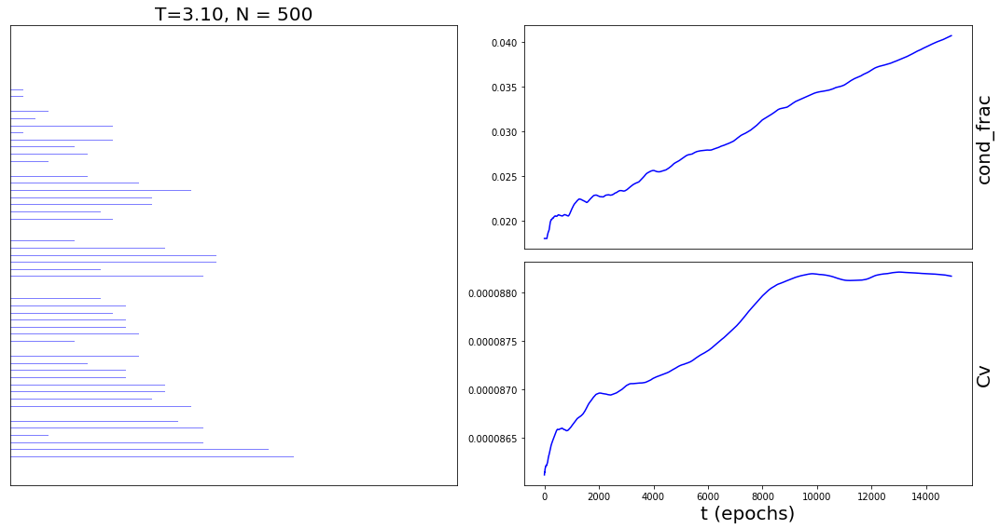

In [46]:
%matplotlib inline
from IPython.display import HTML
import matplotlib
from matplotlib import pyplot as plt, animation as anim
#Set this to embed large videos
matplotlib.rcParams['animation.embed_limit'] = 2**128

#Size of fonts
fs = 20
plt.rcParams.update({'axes.titlesize': fs})
plt.rcParams.update({'axes.labelsize':fs})

#Size of figure
plt.rcParams.update({'figure.figsize':(15,8)})
plt.rcParams.update({'figure.autolayout':True})

#Simulation Parameters
N = 500
M = 50
system_size = (N,M)
temp = 3.1

#Maximum number of monte carlo steps
maxtime = 15000

#Initial Condition (random)
energies = np.random.randint(0, M, size = (N,))
lvals = np.array([np.random.randint(0, n) if n != 0 else 0 for n in energies])
mvals = np.array([np.random.randint(-l, l+1) if l!=0 else 0 for l in lvals])
ic = np.vstack((energies, lvals, mvals)).T

#Initiate the Bose Gas system with the parameters above
gas = BoseGas(initial_state=ic, temperature=temp, max_epochs=maxtime)
ani = bosegas_run(gas, plt,video=True, video_frate=20)
print("Simulation Complete! Now rendering video. Please wait...")
HTML(ani.animate().to_jshtml(default_mode="once"))

### Bose gas above $T^\ast_c$

Run the code in the cell below to simulate the Bose Gas with video. Note that this will be very slow, since the video is generated frame by frame.

You may change the size of fonts and figure as indicated in the comments below. The simulation parameters are

1. The number of particles  is set here to $500$.

2. The maximum 'time' (epochs) of the Metropolis Algorithm, which is set here to $15,000$.

3. The temperature, which is set to $20.0$ (in units of $\hbar\Omega/k_B$). This is above the theoretical $T^\ast_c =  (500\mathbin{/}\zeta(3))^{1/3}\approx 7.465$

100%|██████████| 15000/15000 [01:00<00:00, 248.53it/s]


Simulation Complete! Now rendering video. Please wait...


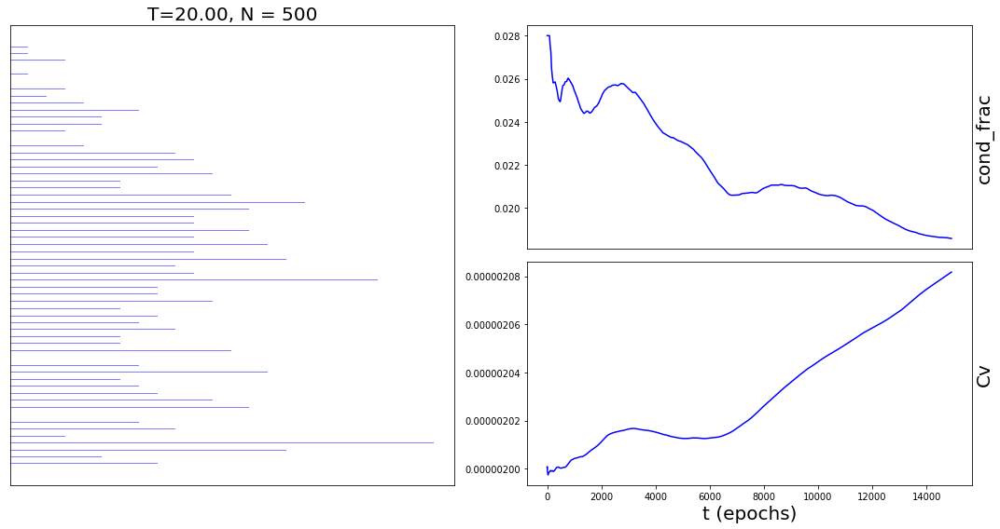

In [47]:
%matplotlib inline
from IPython.display import HTML
import matplotlib
from matplotlib import pyplot as plt, animation as anim
#Set this to embed large videos
matplotlib.rcParams['animation.embed_limit'] = 2**128

#Size of fonts
fs = 20
plt.rcParams.update({'axes.titlesize': fs})
plt.rcParams.update({'axes.labelsize':fs})

#Size of figure
plt.rcParams.update({'figure.figsize':(15,8)})
plt.rcParams.update({'figure.autolayout':True})

#Simulation Parameters
N = 500
M = 50
system_size = (N,M)
temp = 20.0

#Maximum number of monte carlo steps
maxtime = 15000

#Initial Condition (random)
energies = np.random.randint(0, M, size = (N,))
lvals = np.array([np.random.randint(0, n) if n != 0 else 0 for n in energies])
mvals = np.array([np.random.randint(-l, l+1) if l!=0 else 0 for l in lvals])
ic = np.vstack((energies, lvals, mvals)).T

#Initiate the Bose Gas system with the parameters above
gas = BoseGas(initial_state=ic, temperature=temp, max_epochs=maxtime)
ani = bosegas_run(gas, plt,video=True, video_frate=30)
print("Simulation Complete! Now rendering video. Please wait...")
HTML(ani.animate().to_jshtml(default_mode="once"))

### Bose gas below $T^\ast_c$ (without video)

Run the code in the cell below to simulate the Bose Gas without video. Note that this will run faster than the case with video.
You may change the size of fonts and figure as indicated in the comments below. The simulation parameters are

1. The number of particles  is set here to $500$.

2. The maximum 'time' (epochs) of the Metropolis Algorithm, which is set here to $150,000$.

3. The temperature, which is set to $1.3$ (in units of $\hbar\Omega/k_B$). This is below the theoretical $T^\ast_c =  (500\mathbin{/}\zeta(3))^{1/3}\approx 7.465$

4. Alternate temperature, which is set to $30.0$ (in units of $\hbar\Omega/k_B$). This is far above the theoretical $T^\ast_c$.

100%|██████████| 150000/150000 [00:06<00:00, 21893.28it/s]


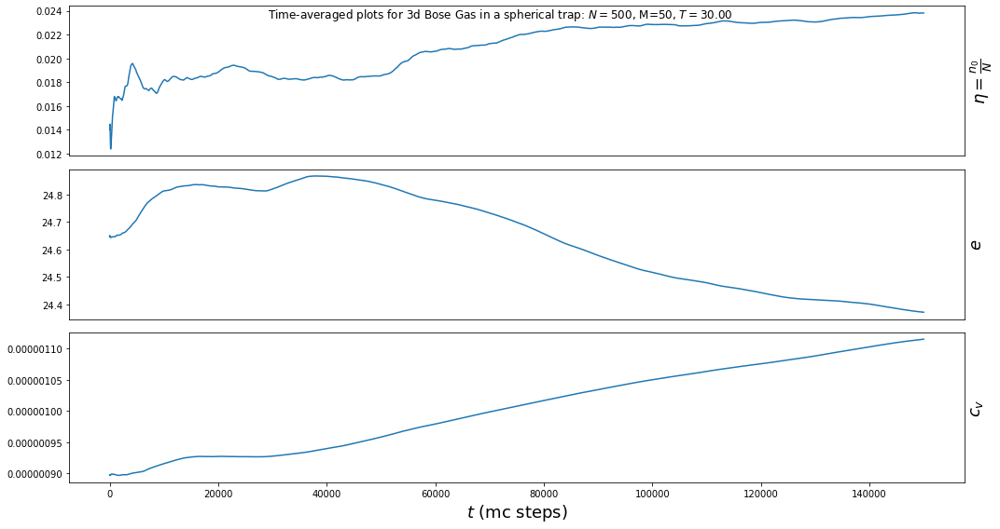

In [56]:
%matplotlib inline
import matplotlib
from matplotlib import pyplot as plt

#Simulation Parameters
N = 500
M = 50
system_size = (N,M)
#temp = 1.3
temp = 30.0

#Maximum number of monte carlo steps
maxtime = 150000

#Initial Condition (random)
energies = np.random.randint(0, M, size = (N,))
lvals = np.array([np.random.randint(0, n) if n != 0 else 0 for n in energies])
mvals = np.array([np.random.randint(-l, l+1) if l!=0 else 0 for l in lvals])
ic = np.vstack((energies, lvals, mvals)).T

#Initiate the Bise Gas system with the parameters above
gas = BoseGas(initial_state=ic, temperature=temp, max_epochs=maxtime)
ani = bosegas_run(gas, plt,video=False)

times = gas.epochdata["epochs"]
cfrac = gas.epochdata["cond_frac"]
energies = gas.epochdata["energies"]
cvs = gas.epochdata["cvs"]

#Plot thermodynamic quantities on these axes
#Size of fonts
fs = 18
plt.rcParams.update({'axes.titlesize': fs})
plt.rcParams.update({'axes.labelsize':fs})

#Size of figure
plt.rcParams.update({'figure.figsize':(15,8)})
plt.rcParams.update({'figure.autolayout':True})
fig, axs = plt.subplots(3)
fig.suptitle(r"Time-averaged plots for $3$d Bose Gas in a spherical trap: $N=%d$, M=$%d$, $T=%1.2lf$" % (N, M, temp))

for ax in axs:
    ax.axes.get_xaxis().set_visible(False)
    ax.ticklabel_format(style='sci',axis='both')
    ax.yaxis.set_label_position("right")
    #ax.yaxis.tick_right()

#Note that we're plotting cumulative time averages
axs[0].set_ylabel(r"$\eta=\frac{n_0}{N}$")
axs[0].plot(times, np.cumsum(cfrac)/np.arange(1,1+len(cfrac)))

axs[1].plot(times,  np.cumsum(energies)/np.arange(1,1+len(energies)))
axs[1].set_ylabel(r"$e$")

axs[2].plot(times, np.cumsum(cvs)/np.arange(1,1+len(cvs)))
axs[2].set_ylabel(r"$c_v$")
axs[2].set_xlabel(r"$t$ (mc steps)")
axs[2].axes.get_xaxis().set_visible(True)
plt.show()

## Exercises

1. Run a simulation of the Bose gas with $1000$ particles in $20,000$ levels.

    *  Run it for more than $50,000$ epochs and look at the condensate fraction $\eta$ and heat capacity $c_v$ as they evolve over time for $T=20$ and $T = 1.0$.   Do they stabilize after sufficiently many epochs? Try running it for longer and longer times (epochs) until the thermodynamic quantities seem to stabilize. Obtain their equilibrium values.
    * Run the simulation without video for several temperatures and try to plot equilibrium values of $\eta$ and $c_v$ as functions of temperature. How well do they agree with theoretical predictions?

2. How would you modify the algorithm above to accommodate for anisotropic harmonic traps, or for particles in a box? 